<a href="https://colab.research.google.com/github/MohamedLambatten/INSE6220-PROJECT/blob/main/INSE6220-Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 926.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.7/169.7 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of category-encoders to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 62.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 72.7 MB/s eta 0:00:00
   ━━━━

In [ ]:
!pip install pycaret[analysis]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.7/169.7 kB 17.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of category-encoders to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 92.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of dash-bootstrap-components to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.5/177.5 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 9.8 MB/s eta 0:00:00
 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [6]:
df = pd.read_csv('https://raw.githubusercontent.com/MohamedLambatten/INSE6220-PROJECT/refs/heads/main/HTRU_2T.csv')
df.head(25)

,Profile_mean,Profile_stdev,Profile_skewness,Profile_kurtosis,DM_mean,DM_stdev,DM_skewness,DM_kurtosis,class
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0
5,93.570312,46.698114,0.531905,0.416721,1.636288,14.545074,10.621748,131.394004,0
6,119.484375,48.765059,0.031460,-0.112168,0.999164,9.279612,19.206230,479.756567,0
7,130.382812,39.844056,-0.158323,0.389540,1.220736,14.378941,13.539456,198.236457,0
8,107.250000,52.627078,0.452688,0.170347,2.331940,14.486853,9.001004,107.972506,0
9,107.257812,39.496488,0.465882,1.162877,4.079431,24.980418,7.397080,57.784738,0


In [7]:

df.head(10)

,Profile_mean,Profile_stdev,Profile_skewness,Profile_kurtosis,DM_mean,DM_stdev,DM_skewness,DM_kurtosis,class
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225,0
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580,0
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909,0
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661,0
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306,0
5,93.570312,46.698114,0.531905,0.416721,1.636288,14.545074,10.621748,131.394004,0
6,119.484375,48.765059,0.031460,-0.112168,0.999164,9.279612,19.206230,479.756567,0
7,130.382812,39.844056,-0.158323,0.389540,1.220736,14.378941,13.539456,198.236457,0
8,107.250000,52.627078,0.452688,0.170347,2.331940,14.486853,9.001004,107.972506,0
9,107.257812,39.496488,0.465882,1.162877,4.079431,24.980418,7.397080,57.784738,0


In [4]:
print("Number of duplicated rows is: ", df.duplicated().sum())
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of duplicated rows is:  0
Number of rows with NaNs is:  0


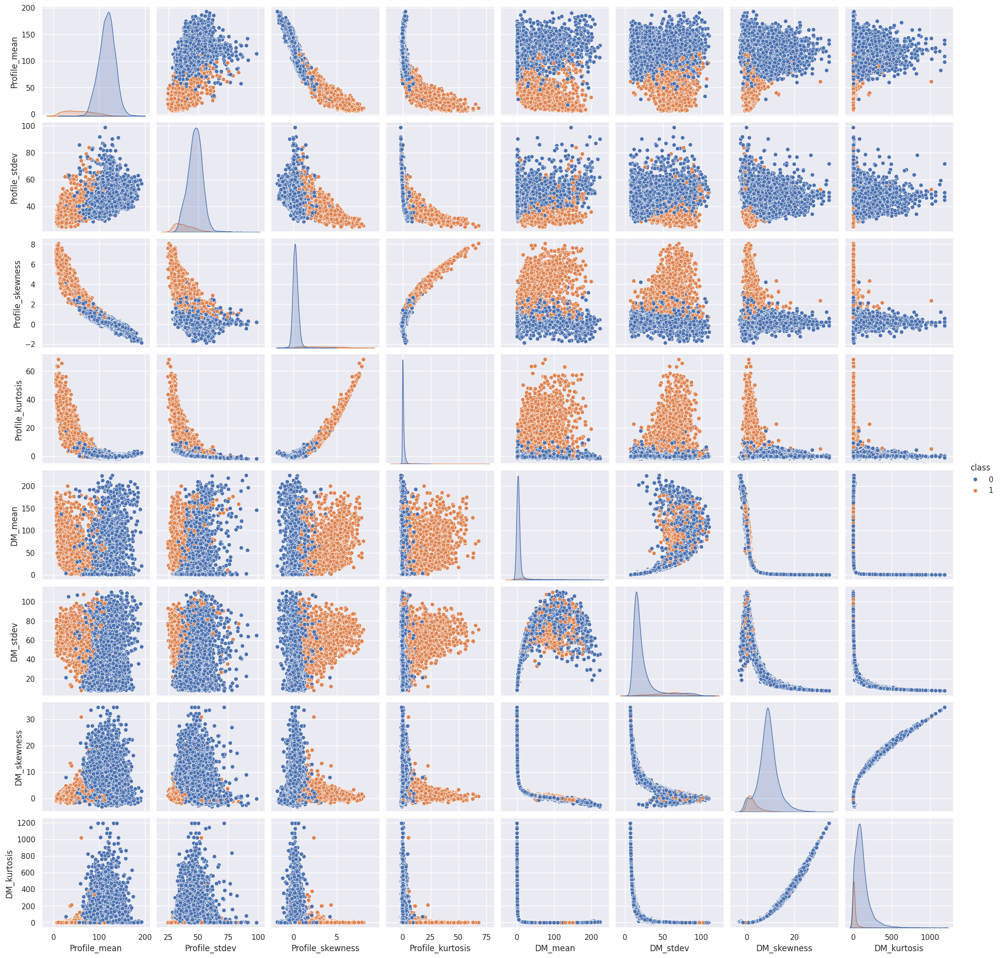

In [8]:
sns.pairplot(df, hue='class')
plt.show()

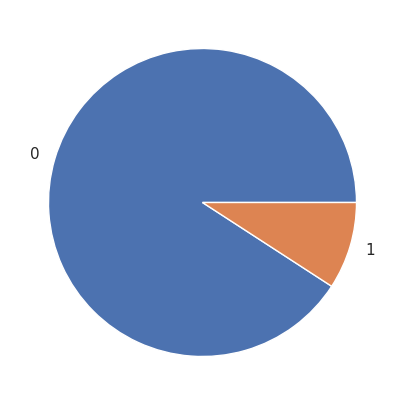

In [9]:
y =df['class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

In [10]:
X = df.drop(columns=['class'])
X.head(10)

,Profile_mean,Profile_stdev,Profile_skewness,Profile_kurtosis,DM_mean,DM_stdev,DM_skewness,DM_kurtosis
0,140.562500,55.683782,-0.234571,-0.699648,3.199833,19.110426,7.975532,74.242225
1,102.507812,58.882430,0.465318,-0.515088,1.677258,14.860146,10.576487,127.393580
2,103.015625,39.341649,0.323328,1.051164,3.121237,21.744669,7.735822,63.171909
3,136.750000,57.178449,-0.068415,-0.636238,3.642977,20.959280,6.896499,53.593661
4,88.726562,40.672225,0.600866,1.123492,1.178930,11.468720,14.269573,252.567306
5,93.570312,46.698114,0.531905,0.416721,1.636288,14.545074,10.621748,131.394004
6,119.484375,48.765059,0.031460,-0.112168,0.999164,9.279612,19.206230,479.756567
7,130.382812,39.844056,-0.158323,0.389540,1.220736,14.378941,13.539456,198.236457
8,107.250000,52.627078,0.452688,0.170347,2.331940,14.486853,9.001004,107.972506
9,107.257812,39.496488,0.465882,1.162877,4.079431,24.980418,7.397080,57.784738


In [11]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Profile_mean,17898.0,111.079968,25.652935,5.812500,100.929688,115.078125,127.085938,192.617188
Profile_stdev,17898.0,46.549532,6.843189,24.772042,42.376018,46.947479,51.023202,98.778911
Profile_skewness,17898.0,0.477857,1.064040,-1.876011,0.027098,0.223240,0.473325,8.069522
Profile_kurtosis,17898.0,1.770279,6.167913,-1.791886,-0.188572,0.198710,0.927783,68.101622
DM_mean,17898.0,12.614400,29.472897,0.213211,1.923077,2.801839,5.464256,223.392141
DM_stdev,17898.0,26.326515,19.470572,7.370432,14.437332,18.461316,28.428104,110.642211
DM_skewness,17898.0,8.303556,4.506092,-3.139270,5.781506,8.433515,10.702959,34.539844
DM_kurtosis,17898.0,104.857709,106.514540,-1.976976,34.960504,83.064556,139.309330,1191.000837


In [12]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Profile_mean,Profile_stdev,Profile_skewness,Profile_kurtosis,DM_mean,DM_stdev,DM_skewness,DM_kurtosis
0,1.149317,1.334832,-0.669570,-0.400459,-0.319440,-0.370625,-0.072798,-0.287438
1,-0.334168,1.802265,-0.011785,-0.370535,-0.371102,-0.588924,0.504427,0.211581
2,-0.314372,-1.053322,-0.145233,-0.116593,-0.322107,-0.235328,-0.125996,-0.391373
3,1.000694,1.553254,-0.513409,-0.390178,-0.304404,-0.275666,-0.312265,-0.481300
4,-0.871402,-0.858879,0.115609,-0.104866,-0.388010,-0.763111,1.324026,1.386794
5,-0.682579,0.021713,0.050796,-0.219458,-0.372492,-0.605106,0.514472,0.249140
6,0.327629,0.323766,-0.419542,-0.305208,-0.394110,-0.875546,2.419609,3.519795
7,0.752482,-0.979903,-0.597908,-0.223865,-0.386592,-0.613639,1.161993,0.876701
8,-0.149304,0.888141,-0.023655,-0.259403,-0.348888,-0.608097,0.154783,0.029244
9,-0.148999,-1.030695,-0.011255,-0.098480,-0.289595,-0.069137,-0.201172,-0.441952


In [13]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Profile_mean,17898.0,-1.683261e-16,1.000028,-4.103640,-0.395688,0.155860,0.623960,3.178564
Profile_stdev,17898.0,1.735665e-15,1.000028,-3.182449,-0.609896,0.058154,0.653759,7.632529
Profile_skewness,17898.0,6.351930e-17,1.000028,-2.212262,-0.423642,-0.239300,-0.004259,7.134956
Profile_kurtosis,17898.0,1.270386e-17,1.000028,-0.577548,-0.317596,-0.254805,-0.136597,10.754560
DM_mean,17898.0,1.270386e-17,1.000028,-0.420778,-0.362761,-0.332944,-0.242607,7.151778
DM_stdev,17898.0,2.540772e-17,1.000028,-0.973603,-0.610640,-0.403964,0.107940,4.330538
DM_skewness,17898.0,4.446351e-16,1.000028,-2.539483,-0.559714,0.028841,0.532495,5.822567
DM_kurtosis,17898.0,3.175965e-17,1.000028,-1.003034,-0.656241,-0.204608,0.323454,10.197420


In [14]:
observations = list(df.index)
variables = list(df.columns)

<ipython-input-15-4e6743a6f098>:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45);


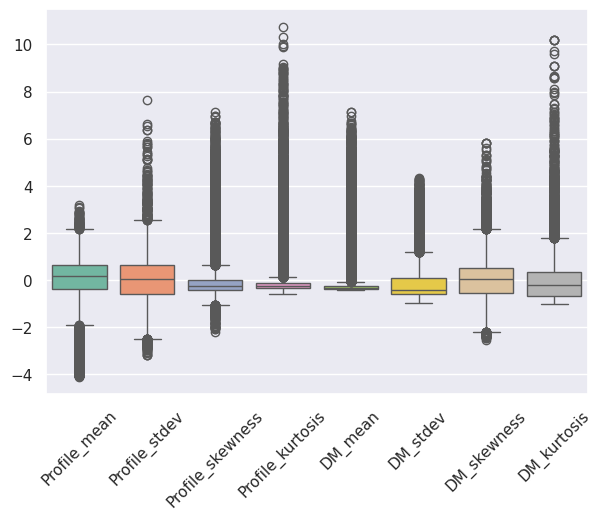

In [15]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

<ipython-input-16-1b1c93c49b26>:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45);


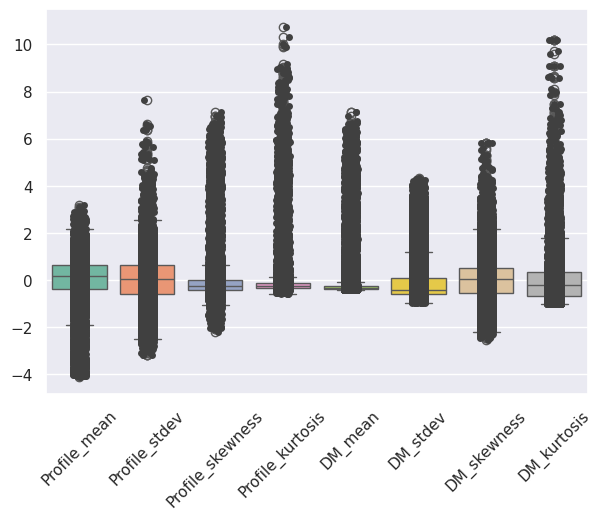

In [16]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

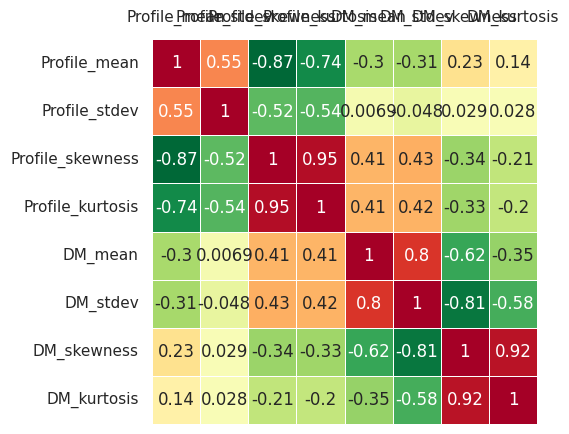

In [17]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

Text(0, 0.5, '$Z_2$')

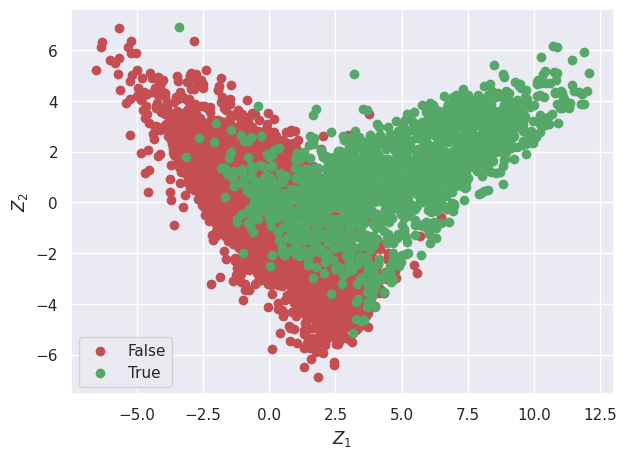

In [18]:
pca = PCA()
Z = pca.fit_transform(X)

idx_False = np.where(y == 0)
idx_True = np.where(y == 1)

plt. figure()
plt.scatter(Z[idx_False,0], Z[idx_False,1], c='r', label='False')
plt.scatter(Z[idx_True,0], Z[idx_True,1], c='g', label='True')
plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

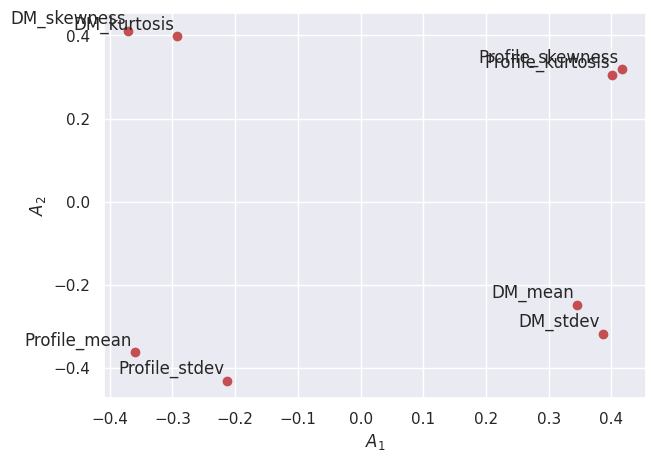

In [19]:
A = pca.components_.T

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

Text(0, 0.5, 'Explained variance')

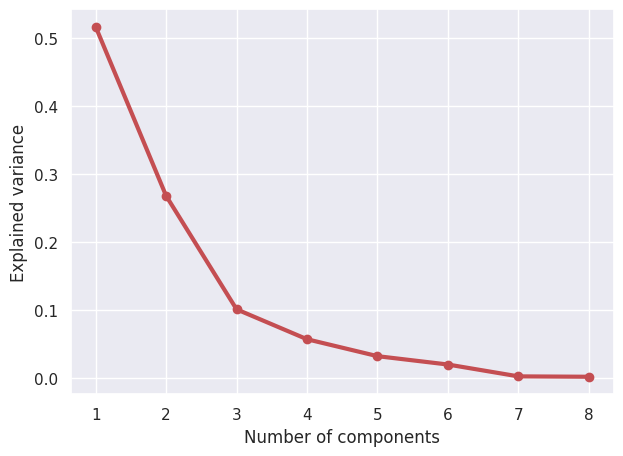

In [20]:
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

Text(0, 0.5, 'Cumulative explained variance')

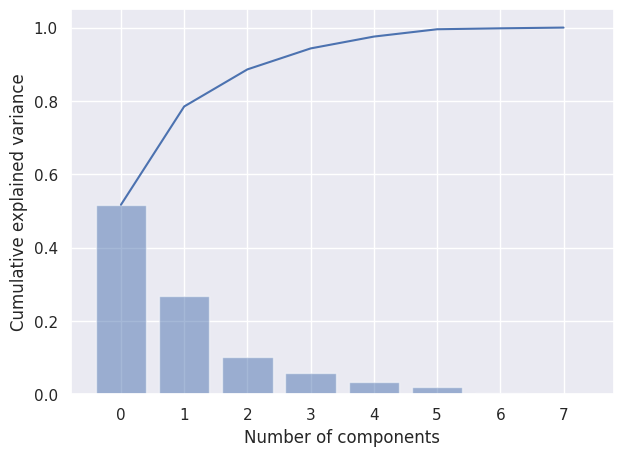

In [21]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

In [22]:
PC_variance = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(ell* 100)
}
PC_variance

{'0': 'PC 1 (51.7%)',
 '1': 'PC 2 (26.8%)',
 '2': 'PC 3 (10.1%)',
 '3': 'PC 4 (5.7%)',
 '4': 'PC 5 (3.2%)',
 '5': 'PC 6 (2.0%)',
 '6': 'PC 7 (0.3%)',
 '7': 'PC 8 (0.2%)'}

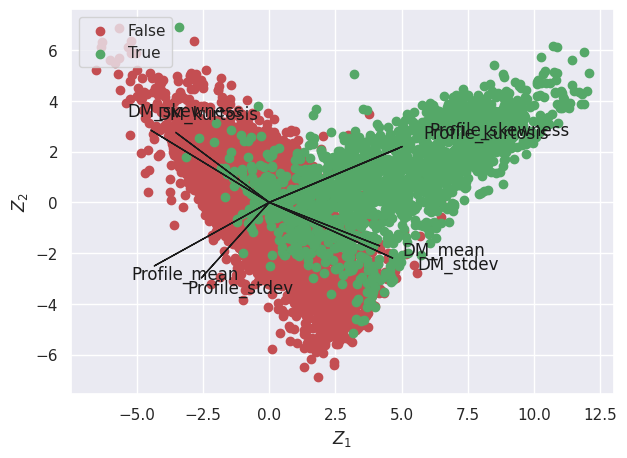

In [23]:
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
plt.scatter(Z[idx_False,0], Z[idx_False,1], c='r', label='False')
plt.scatter(Z[idx_True,0], Z[idx_True,1], c='g', label='True')
plt.legend(loc='upper left')
for i in range(len(A1)):
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')



In [24]:
!pip install pca

In [25]:
from pca import pca
model = pca(n_components=0.85)
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [85.0%] explained variance using the [8] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [85.00%] explained variance.
[pca] >The PCA reduction is performed on the [8] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


In [26]:
out['PC']

,PC1,PC2,PC3
0,-1.278849,-1.273133,0.016213
1,-1.020553,-0.201162,0.670478
2,0.188289,0.432114,-0.979766
3,-1.015466,-1.469881,-0.018832
4,-0.822626,2.123651,0.407953
...,...,...,...
17893,-2.689482,0.136982,1.777768
17894,0.629805,-1.702292,-0.427777
17895,0.681834,-2.686170,0.449914
17896,-1.103912,-0.116508,0.320884


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


[scatterd] >INFO> Create scatterplot


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [94.31%] of the variance'}, xlabel='PC1 (51.6% expl.var)', ylabel='PC2 (26.8% expl.var)'>)

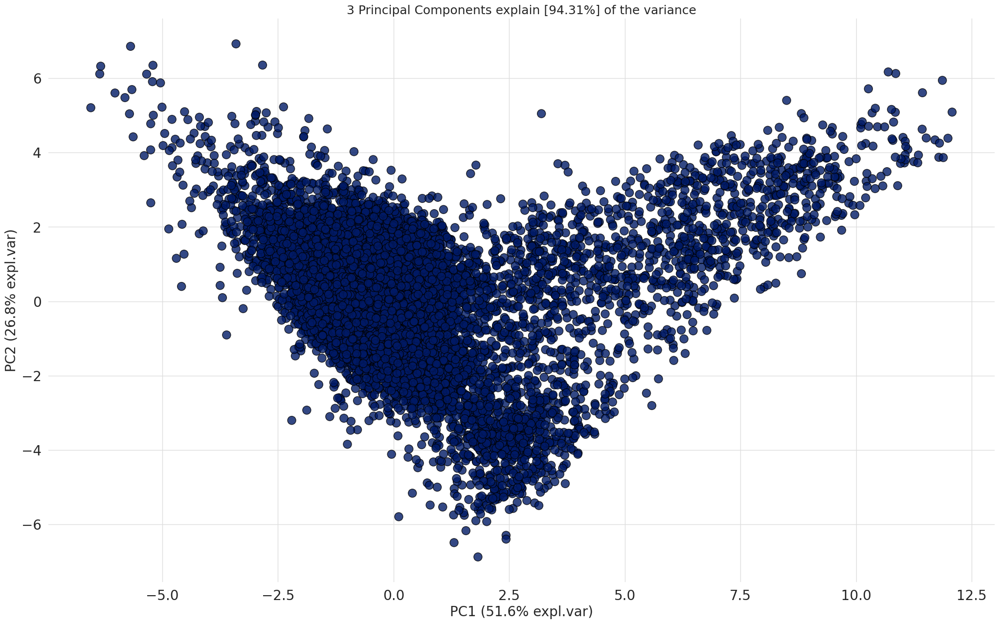

In [27]:
model.scatter(label=True, legend=False)

In [28]:
A = out['loadings'].T

<ipython-input-29-da59a7d9feff>:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],


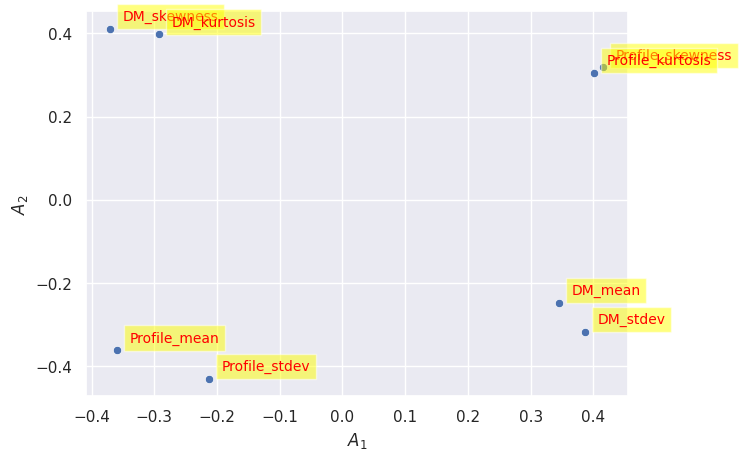

In [29]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

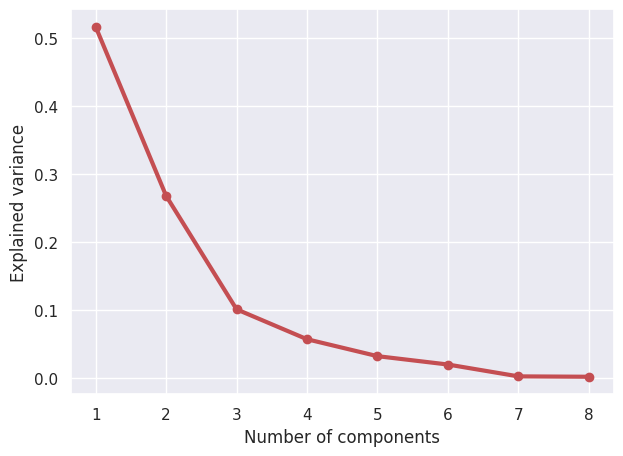

In [30]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

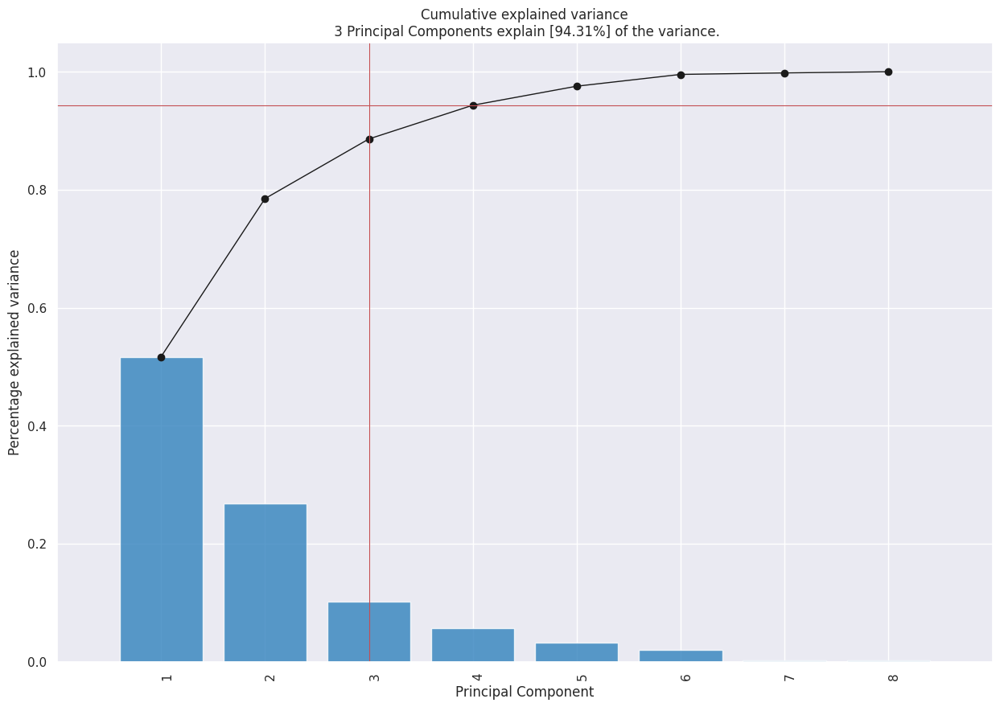

In [31]:
model.plot();

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [94.31%] of the variance'}, xlabel='PC1 (51.6% expl.var)', ylabel='PC2 (26.8% expl.var)'>)

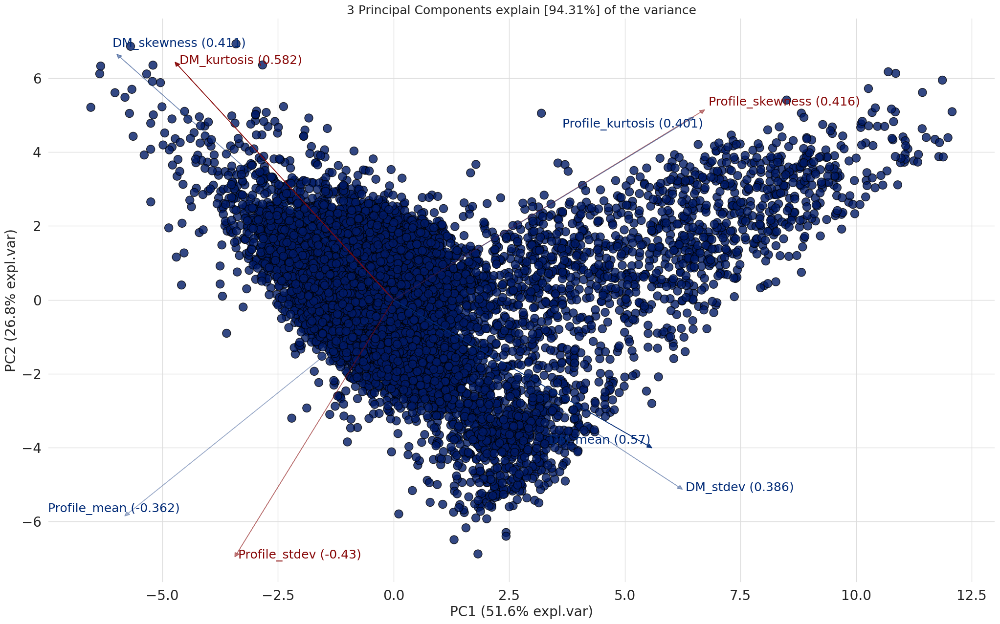

In [32]:
model.biplot(label=False, legend=False)

In [33]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (16108, 9)
Unseen Data For Predictions: (1790, 9)


In [34]:
from pycaret.classification import *
clf = setup(data=data, target='class', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(16108, 9)"
4,Transformed data shape,"(16108, 9)"
5,Transformed train set shape,"(11275, 9)"
6,Transformed test set shape,"(4833, 9)"
7,Numeric features,8
8,Preprocess,True
9,Imputation type,simple


In [35]:
best_model = compare_models()


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9792,0.9671,0.8346,0.9339,0.8812,0.8698,0.8717,1.9130
xgboost,Extreme Gradient Boosting,0.9792,0.9758,0.8510,0.9189,0.8830,0.8717,0.8728,0.1970
lightgbm,Light Gradient Boosting Machine,0.9792,0.9775,0.8423,0.9263,0.8816,0.8702,0.8718,0.5760
et,Extra Trees Classifier,0.9788,0.9708,0.8308,0.9326,0.8784,0.8668,0.8688,0.6490
gbc,Gradient Boosting Classifier,0.9787,0.9762,0.8500,0.9140,0.8804,0.8688,0.8697,3.0950
lr,Logistic Regression,0.9777,0.9749,0.8154,0.9352,0.8708,0.8587,0.8613,0.8170
ada,Ada Boost Classifier,0.9770,0.9753,0.8231,0.9198,0.8684,0.8559,0.8576,0.8000
lda,Linear Discriminant Analysis,0.9733,0.9736,0.7567,0.9426,0.8394,0.8250,0.8310,0.0300
knn,K Neighbors Classifier,0.9722,0.9313,0.7846,0.9027,0.8387,0.8236,0.8265,0.1040
svm,SVM - Linear Kernel,0.9698,0.9570,0.7404,0.9247,0.8165,0.8004,0.8095,0.2810


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [36]:
best_model


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

In [37]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9814,0.9760,0.8462,0.9462,0.8934,0.8832,0.8849
1,0.9770,0.9737,0.8365,0.9062,0.8700,0.8574,0.8582
2,0.9796,0.9922,0.8558,0.9175,0.8856,0.8744,0.8750
3,0.9805,0.9380,0.8173,0.9659,0.8854,0.8748,0.8785
4,0.9787,0.9417,0.8173,0.9444,0.8763,0.8647,0.8674
5,0.9787,0.9668,0.8269,0.9348,0.8776,0.8659,0.8679
6,0.9796,0.9480,0.8558,0.9175,0.8856,0.8744,0.8750
7,0.9778,0.9873,0.7981,0.9540,0.8691,0.8571,0.8612
8,0.9805,0.9711,0.8558,0.9271,0.8900,0.8793,0.8802


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [38]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9761,0.9730,0.7981,0.9326,0.8601,0.8471,0.8502
1,0.9725,0.9684,0.8173,0.8763,0.8458,0.8307,0.8313
2,0.9814,0.9881,0.8750,0.9192,0.8966,0.8863,0.8867
3,0.9796,0.9563,0.8077,0.9655,0.8796,0.8685,0.8727
4,0.9734,0.9631,0.8173,0.8854,0.8500,0.8354,0.8362
5,0.9805,0.9697,0.8558,0.9271,0.8900,0.8793,0.8802
6,0.9760,0.9654,0.8462,0.8889,0.8670,0.8538,0.8542
7,0.9769,0.9698,0.7981,0.9432,0.8646,0.8521,0.8556
8,0.9831,0.9788,0.8750,0.9381,0.9055,0.8962,0.8969


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [45]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [42]:
xgboost = create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9823,0.9769,0.8558,0.9468,0.8990,0.8893,0.8907
1,0.9761,0.9821,0.8462,0.8889,0.8670,0.8539,0.8542
2,0.9823,0.9872,0.8846,0.9200,0.9020,0.8922,0.8924
3,0.9778,0.9625,0.7981,0.9540,0.8691,0.8571,0.8612
4,0.9752,0.9698,0.8269,0.8958,0.8600,0.8464,0.8472
5,0.9814,0.9644,0.8942,0.9029,0.8986,0.8883,0.8883
6,0.9787,0.9659,0.8750,0.8922,0.8835,0.8718,0.8718
7,0.9760,0.9835,0.7981,0.9326,0.8601,0.8471,0.8502
8,0.9840,0.9828,0.8846,0.9388,0.9109,0.9021,0.9026


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [46]:
tuned_xgboost = tune_model(xgboost)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9787,0.9759,0.8942,0.8774,0.8857,0.8740,0.8740
1,0.9761,0.9814,0.8846,0.8598,0.8720,0.8588,0.8589
2,0.9770,0.9815,0.9327,0.8362,0.8818,0.8691,0.8707
3,0.9770,0.9582,0.8269,0.9149,0.8687,0.8561,0.8574
4,0.9699,0.9607,0.8365,0.8365,0.8365,0.8199,0.8199
5,0.9752,0.9589,0.9038,0.8393,0.8704,0.8567,0.8574
6,0.9716,0.9628,0.8846,0.8214,0.8519,0.8362,0.8369
7,0.9778,0.9836,0.8654,0.8911,0.8780,0.8659,0.8660
8,0.9796,0.9820,0.9135,0.8716,0.8920,0.8808,0.8811


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [47]:
evaluate_model(tuned_xgboost)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [48]:
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9761,0.9730,0.7981,0.9326,0.8601,0.8471,0.8502
1,0.9725,0.9684,0.8173,0.8763,0.8458,0.8307,0.8313
2,0.9814,0.9881,0.8750,0.9192,0.8966,0.8863,0.8867
3,0.9796,0.9563,0.8077,0.9655,0.8796,0.8685,0.8727
4,0.9734,0.9631,0.8173,0.8854,0.8500,0.8354,0.8362
5,0.9805,0.9697,0.8558,0.9271,0.8900,0.8793,0.8802
6,0.9760,0.9654,0.8462,0.8889,0.8670,0.8538,0.8542
7,0.9769,0.9698,0.7981,0.9432,0.8646,0.8521,0.8556
8,0.9831,0.9788,0.8750,0.9381,0.9055,0.8962,0.8969


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [49]:
tuned_best_model

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

In [50]:
evaluate_model(tuned_best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [51]:
clf_pca = setup(data=df, target='class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,class
2,Target type,Binary
3,Original data shape,"(17898, 9)"
4,Transformed data shape,"(17898, 4)"
5,Transformed train set shape,"(12528, 4)"
6,Transformed test set shape,"(5370, 4)"
7,Numeric features,8
8,Preprocess,True
9,Imputation type,simple


In [52]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9763,0.9548,0.8091,0.9227,0.8618,0.8489,0.8513,1.4890
lightgbm,Light Gradient Boosting Machine,0.9763,0.9653,0.8161,0.9163,0.8628,0.8499,0.8519,0.3400
knn,K Neighbors Classifier,0.9761,0.9403,0.8170,0.9134,0.8621,0.8491,0.8509,0.1120
et,Extra Trees Classifier,0.9759,0.9590,0.8047,0.9222,0.8591,0.8460,0.8485,0.5490
gbc,Gradient Boosting Classifier,0.9751,0.9648,0.8013,0.9160,0.8544,0.8409,0.8434,1.5240
xgboost,Extreme Gradient Boosting,0.9751,0.9611,0.8126,0.9066,0.8564,0.8429,0.8447,0.2160
ada,Ada Boost Classifier,0.9729,0.9613,0.7682,0.9223,0.8378,0.8231,0.8275,0.5400
lr,Logistic Regression,0.9708,0.9618,0.7342,0.9335,0.8211,0.8055,0.8128,0.0490
svm,SVM - Linear Kernel,0.9690,0.9597,0.7036,0.9451,0.8056,0.7892,0.7999,0.0560
lda,Linear Discriminant Analysis,0.9662,0.9629,0.6670,0.9476,0.7821,0.7644,0.7787,0.0440


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [58]:
best_model_pca

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

In [53]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9721,0.9492,0.7982,0.8835,0.8387,0.8235,0.8247
1,0.9769,0.9537,0.8522,0.8909,0.8711,0.8584,0.8587
2,0.9769,0.9256,0.7913,0.9479,0.8626,0.8500,0.8542
3,0.9689,0.9676,0.7217,0.9222,0.8098,0.7931,0.8002
4,0.9625,0.9323,0.7478,0.8269,0.7854,0.7649,0.7661
5,0.9785,0.9587,0.8174,0.9400,0.8744,0.8627,0.8652
6,0.9761,0.9646,0.8174,0.9126,0.8624,0.8493,0.8509
7,0.9705,0.9698,0.7652,0.8980,0.8263,0.8103,0.8134
8,0.9720,0.9547,0.7895,0.8911,0.8372,0.8220,0.8238


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [ ]:
tuned_best_model_pca

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [55]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
lightgbm_pca = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9769,0.9581,0.8158,0.9208,0.8651,0.8525,0.8544
1,0.9785,0.9652,0.8696,0.8929,0.8811,0.8692,0.8693
2,0.9769,0.9549,0.8174,0.9216,0.8664,0.8537,0.8556
3,0.9721,0.9761,0.8000,0.8846,0.8402,0.8249,0.8262
4,0.9657,0.9457,0.7217,0.8830,0.7943,0.7757,0.7804
5,0.9777,0.9656,0.8000,0.9485,0.8679,0.8558,0.8595
6,0.9792,0.9758,0.8087,0.9588,0.8774,0.8661,0.8699
7,0.9769,0.9616,0.8174,0.9216,0.8664,0.8537,0.8556
8,0.9776,0.9649,0.8509,0.8981,0.8739,0.8616,0.8620


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
tuned_lightgbm_pca = tune_model(lightgbm_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9777,0.9632,0.8421,0.9057,0.8727,0.8605,0.8612
1,0.9800,0.9628,0.8783,0.9018,0.8899,0.8789,0.8790
2,0.9792,0.9669,0.8174,0.9495,0.8785,0.8672,0.8701
3,0.9705,0.9817,0.7565,0.9062,0.8246,0.8087,0.8126
4,0.9617,0.9515,0.7043,0.8526,0.7714,0.7507,0.7548
5,0.9777,0.9665,0.8000,0.9485,0.8679,0.8558,0.8595
6,0.9792,0.9801,0.8174,0.9495,0.8785,0.8672,0.8701
7,0.9785,0.9696,0.8261,0.9314,0.8756,0.8638,0.8657
8,0.9736,0.9602,0.8333,0.8716,0.8520,0.8376,0.8378


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


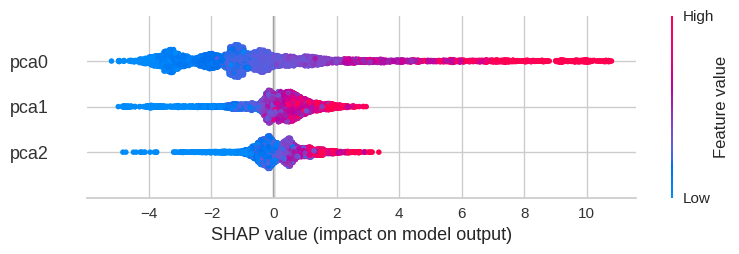

In [ ]:
interpret_model(tuned_lightgbm_pca, plot='summary')

In [ ]:
interpret_model(tuned_lightgbm_pca, plot='reason', observation=32)

In [ ]:
interpret_model(tuned_lightgbm_pca, plot='reason')